# Cassava Leaf Disease Detection
- Jan Burian
- https://www.kaggle.com/competitions/cassava-leaf-disease-classification

## Modules import

In [1]:
import numpy as np
from pathlib import Path 
import os
import pandas as pd
import json 
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.model_selection import train_test_split 

import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image
import torch.nn.functional as F

In [2]:
!pip install timm
!pip install -U albumentations
!pip install wandb

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python -m pip install --upgrade pip


## Preparing data

In [3]:
data_directory = Path('./data/cassava-leaf-disease-classification')
BASE_directory = os.path.join(os.getcwd(), data_directory)
!pwd # current working directory
print(BASE_directory)

/auto/brno2/home/jburian/ondemand
/auto/brno2/home/jburian/ondemand/data/cassava-leaf-disease-classification


In [4]:
train_csv = pd.read_csv(os.path.join(BASE_directory, 'train.csv'))
train_csv.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


## Training data analysis

In [5]:
def get_mapping_dictionary() -> dict:
    num_to_disease_map = open(os.path.join(BASE_directory, 'label_num_to_disease_map.json'))
    num_to_disease_map_dict = json.load(num_to_disease_map)
    num_to_disease_map_dict = {int(key):num_to_disease_map_dict[key] for key in num_to_disease_map_dict}
    
    return num_to_disease_map_dict


def pair_indices_and_class_names(class_distribution_dict: dict) -> dict:
    num_to_disease_map_dict = get_mapping_dictionary()
    
#     print(num_to_disease_map_dict)
    res_dict = {}
    
    for key in class_distribution_dict.keys():
        if key in num_to_disease_map_dict:
            new_key = num_to_disease_map_dict[key]
            res_dict[new_key] = class_distribution_dict[key]
    
#     print(class_distribution_dict)
    return res_dict

In [6]:
def visualize_class_distributions_training_data(mapped_class_distribution_dict: dict):
    fig, ax = plt.subplots()

    classes = list(mapped_class_distribution_dict.keys())
    counts = list(mapped_class_distribution_dict.values())
    bar_colors = ['tab:red', 'tab:blue', 'tab:orange', 'tab:purple', 'tab:green']

    ax.bar(classes, counts, color=bar_colors)

    for i, count in enumerate(counts):
        ax.text(classes[i], count + 10, str(count), ha='center', va='bottom')

    ax.set_xticks(classes)  # Use set_xticks to set the exact tick positions
    ax.set_xticklabels(classes, rotation=90)
    ax.set_ylabel('Number of training samples')
    ax.set_xlabel('Classes')
    ax.set_title('Number of samples in training data')

    plt.show()

{0: 1087, 3: 13158, 1: 2189, 2: 2386, 4: 2577}
{'Cassava Bacterial Blight (CBB)': 1087, 'Cassava Mosaic Disease (CMD)': 13158, 'Cassava Brown Streak Disease (CBSD)': 2189, 'Cassava Green Mottle (CGM)': 2386, 'Healthy': 2577}


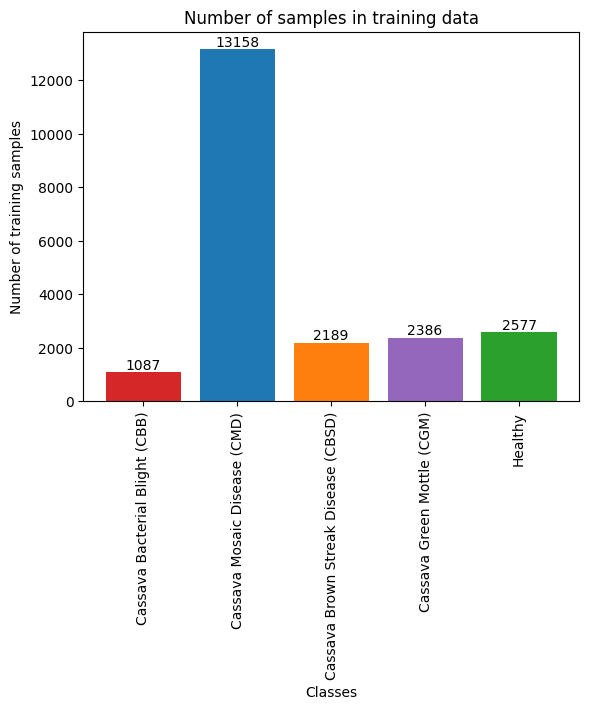

In [7]:
# Class distribution in training data
class_distribution_dict = {}
for i in range(len(train_csv)): 
#     print(train_csv.loc[i, "label"])
    key = train_csv.loc[i, "label"]
    
    if key not in class_distribution_dict:
        class_distribution_dict[key] = 1
        
    else:
        class_distribution_dict[key] += 1
        
print(class_distribution_dict)
mapped_class_distribution_dict = pair_indices_and_class_names(class_distribution_dict)
print(mapped_class_distribution_dict)
visualize_class_distributions_training_data(mapped_class_distribution_dict)

## Visualizing training data

In [8]:
train_images_dir = os.path.join(BASE_directory, 'train_images')
mapping_dictionary = get_mapping_dictionary()

def plot_n_training_images(n_images: int, train_csv: pd.DataFrame, number_classes: int):
    for j in range(number_classes):
        filtered_df = train_csv[train_csv['label'] == j]
        random_rows = filtered_df.sample(n_images)

        fig, axes = plt.subplots(1, n_images, figsize=(30, 5))  

        for i in range(len(random_rows)):
            image_id = random_rows.iloc[i]['image_id']
            label = random_rows.iloc[i]['label']

            class_name = mapping_dictionary[label]

            img_path = os.path.join(train_images_dir, image_id)
            img = Image.open(img_path)

            axes[i].imshow(img)
            axes[i].set_title(f'{class_name} ({image_id})')
            axes[i].axis('off')

        plt.show()

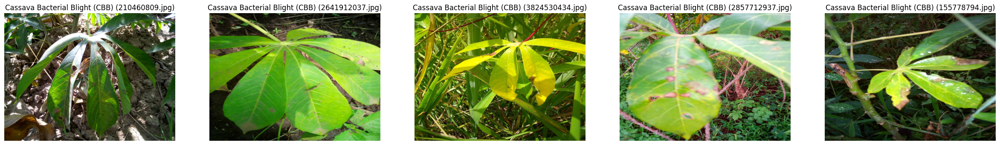

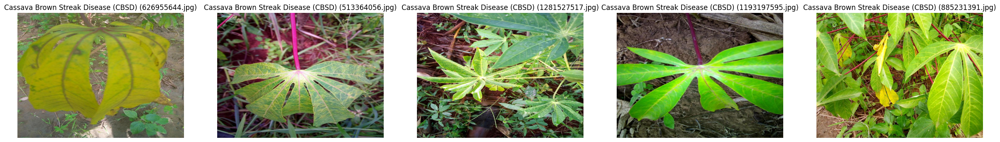

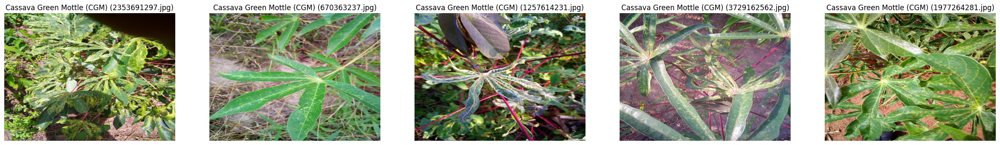

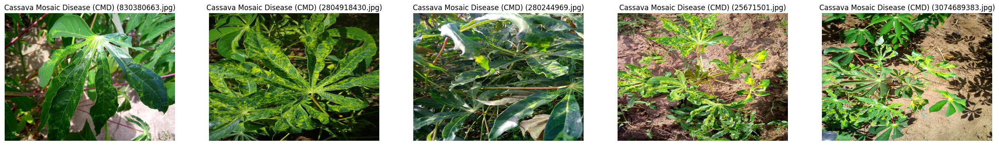

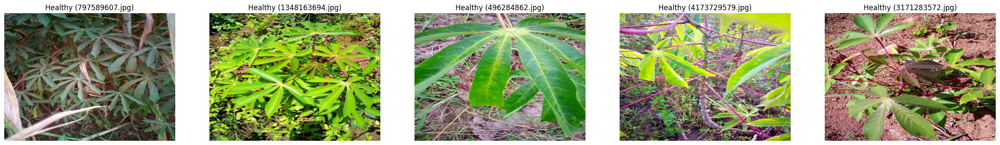

In [9]:
num_classes = len(mapped_class_distribution_dict)
plot_n_training_images(5, train_csv, 5)

## Dataset

In [14]:
# https://colab.research.google.com/github/pytorch/tutorials/blob/gh-pages/_downloads/f498e3bcd9b6159ecfb1a07d6551287d/data_loading_tutorial.ipynb#scrollTo=amZmMAzuGgTu
# https://pytorch.org/tutorials/beginner/data_loading_tutorial.html
# https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

class CassavaLeafDataset(Dataset):
    def __init__(self, image_ids: list, labels: list, image_dir: str, dimension=None, transform=None, target_transform=None):
        self.image_ids = image_ids
        self.labels = labels
        self.image_dir = image_dir
        self.dimension = dimension
        self.transform = transform
        self.target_transform = target_transform
    
    # returns the length
    def __len__(self):
        return len(self.image_ids)
    
    # returns the image and label for that index
    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_ids[idx])
        img = read_image(img_path)
        label = self.labels[idx]
        
#         if self.dimension: # TODO: tensor resizing
#             img = F.interpolate(img, size=self.dimension)
        
        # convert to numpy array
        img = np.array(img)
        
        if self.transform:
            image = self.transform(image)
            
        if self.target_transform:
            label = self.target_transform(label)
        
        return img, label

In [15]:
# Parameters
batch_size = 4 # number of samples for training
num_workers = 2

dimension = 224

device = "cuda"


# Splitting dataset into 3 parts
path_to_csv_file = os.path.join(BASE_directory, 'train.csv')
path_to_image_directory = os.path.join(BASE_directory, 'train_images')
print(path_to_image_directory)

train_csv = pd.read_csv(path_to_csv_file)

# Dividing data to train, validation and test subsets (60 % + 20 % + 20 %)
x_train, x_test, y_train, y_test = train_test_split(train_csv['image_id'], 
                                                    train_csv['label'], 
                                                    test_size=0.2, 
                                                    random_state=1) # Test data

# Dividing again obtained train data to get validation data and final train data
x_train, x_val, y_train, y_val = train_test_split(x_train, 
                                                  y_train, 
                                                  test_size=0.25, 
                                                  random_state=1) # 0.25 x 0.8 = 0.2 # Train and validation data



train_dataset = CassavaLeafDataset(
    image_ids=x_train.values,
    labels=y_train.values,
    image_dir=path_to_image_directory,
    dimension=dimension
)


val_dataset = CassavaLeafDataset(
    image_ids=x_val.values,
    labels=y_val.values,
    image_dir=path_to_image_directory,
    dimension=dimension
)

test_dataset = CassavaLeafDataset(
    image_ids=x_test.values,
    labels=y_test.values,
    image_dir=path_to_image_directory,
    dimension=dimension
)

/auto/brno2/home/jburian/ondemand/data/cassava-leaf-disease-classification/train_images


## DataLoader

In [16]:
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=True,
)


val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=False
)


test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=False
)


loaders = {'train': train_loader, 'val': val_loader, 'test': test_loader}

# print(len(x_train))
# print(len(y_train))
# print(len(x_val))
# print(len(y_val))
# print(len(x_test))
# print(len(y_test))



## Visualizing training data
from train_loader

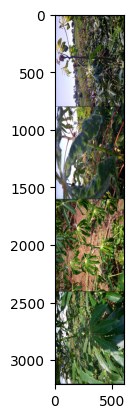

Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Cassava Mosaic Disease (CMD) Healthy


In [18]:
classes = list(get_mapping_dictionary().values())

# functions to show an image
def imshow(img):
#     img = img / 2 + 0.5     # denormalizace
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg))
    plt.show()


# get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))

# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(batch_size)))